In [1]:
# Spark imports
from pyspark.sql import SparkSession, DataFrame
from pyspark.sql.functions import udf, pandas_udf, col, PandasUDFType, lit, round, array_contains, from_unixtime
from pyspark.sql.functions import col, radians, sin, cos, sqrt, atan2, array, collect_list, struct, row_number, expr
from pyspark.sql.functions import monotonically_increasing_id, row_number, col
from pyspark.sql.types import DoubleType, StructType, StructField
from pyspark.sql.functions import when, split, col, concat_ws,  min, max, to_date
from pyspark.sql import functions as F
from pyspark.sql.window import Window


# Regular imports
from IPython.display import display, HTML
import os, time
import subprocess
import os,shutil
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import h3pandas
import h3

# Settings
project = "project_opdi"

# Getting today's date
today = datetime.today().strftime('%d %B %Y')

# Setting logging properties
#shutil.copy("/runtime-addons/cmladdon-2.0.40-b154/log4j.properties", "/etc/spark/conf/") 

# Spark Session Initialization
spark = SparkSession.builder \
    .appName("OSN Flight Table") \
    .config("spark.log.level", "ERROR")\
    .config("spark.hadoop.fs.azure.ext.cab.required.group", "eur-app-opdi") \
    .config("spark.kerberos.access.hadoopFileSystems", "abfs://storage-fs@cdpdllive.dfs.core.windows.net/data/project/opdi.db/unmanaged") \
    .config("spark.driver.cores", "1") \
    .config("spark.driver.memory", "8G") \
    .config("spark.executor.memory", "8G") \
    .config("spark.executor.cores", "1") \
    .config("spark.executor.instances", "2") \
    .config("spark.dynamicAllocation.maxExecutors", "20") \
    .config("spark.network.timeout", "800s") \
    .config("spark.executor.heartbeatInterval", "400s") \
    .config("spark.driver.maxResultSize", "4g") \
    .enableHiveSupport() \
    .getOrCreate()

# Get environment variables
engine_id = os.getenv('CDSW_ENGINE_ID')
domain = os.getenv('CDSW_DOMAIN')

# Format the URL
url = f"https://spark-{engine_id}.{domain}"

# Display the clickable URL
display(HTML(f'<a href="{url}">{url}</a>'))

Setting spark.hadoop.yarn.resourcemanager.principal to quinten.goens


## Query testing sample function

In [2]:
# importing datetime module
import datetime
import time
 
# assigned regular string date
date = datetime.datetime(2024, 4, 1, 0, 0)
date_str = date.strftime('%Y-%m-%d')

# displaying unix timestamp after conversion
date_unix = int(time.mktime(date.timetuple()))

start_time_unix = date_unix - 5*24*60*60
end_time_unix = date_unix + 5*24*60*60

df = spark.sql(f"""
SELECT * 
FROM project_opdi.osn_tracks_clustered otc
WHERE track_id IN (
    SELECT id 
    FROM project_opdi.osn_flight_table oft
    WHERE oft.ADES = 'LPPT' 
    AND oft.DOF == TO_DATE('{date_str}')
)  and otc.event_time >= {start_time_unix}
    and otc.event_time <= {end_time_unix}
LIMIT 10000;""").toPandas()

Hive Session ID = 7c81d2b5-f0e4-47bd-821d-f0dfb1b7b44d


In [3]:
df

,event_time,icao24,lat,lon,velocity,heading,vert_rate,callsign,on_ground,alert,...,h3_res_7,h3_res_6,h3_res_5,h3_res_4,h3_res_3,h3_res_2,h3_res_1,h3_res_0,segment_distance_nm,cumulative_distance_nm
0,1711992545,49520f,53.363274,-2.277328,NaN,NaN,NaN,TAP1313,True,False,...,871951b59ffffff,861951b5fffffff,851951b7fffffff,841951bffffffff,831951fffffffff,821957fffffffff,81197ffffffffff,8019fffffffffff,NaN,NaN
1,1711992550,49520f,53.363319,-2.277270,NaN,NaN,NaN,TAP1313,True,False,...,871951b59ffffff,861951b5fffffff,851951b7fffffff,841951bffffffff,831951fffffffff,821957fffffffff,81197ffffffffff,8019fffffffffff,0.003464,0.003464
2,1711992555,49520f,53.363342,-2.277199,NaN,NaN,NaN,TAP1313,True,False,...,871951b59ffffff,861951b5fffffff,851951b7fffffff,841951bffffffff,831951fffffffff,821957fffffffff,81197ffffffffff,8019fffffffffff,0.002872,0.006336
3,1711992560,49520f,53.363354,-2.277179,NaN,NaN,NaN,TAP1313,True,False,...,871951b59ffffff,861951b5fffffff,851951b7fffffff,841951bffffffff,831951fffffffff,821957fffffffff,81197ffffffffff,8019fffffffffff,0.001006,0.007342
4,1711992565,49520f,53.363365,-2.277113,NaN,NaN,NaN,TAP1313,True,False,...,871951b59ffffff,861951b5fffffff,851951b7fffffff,841951bffffffff,831951fffffffff,821957fffffffff,81197ffffffffff,8019fffffffffff,0.002472,0.009814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1711985180,39a2e0,48.292314,0.150917,223.020819,236.859779,5.52704,AFR84XD,False,False,...,87186112dffffff,86186112fffffff,85186113fffffff,8418611ffffffff,831861fffffffff,821867fffffffff,81187ffffffffff,8019fffffffffff,0.574666,105.103834
9996,1711985185,39a2e0,48.286728,0.138124,221.878093,236.825765,5.20192,AFR84XD,False,False,...,87186112dffffff,86186112fffffff,85186113fffffff,8418611ffffffff,831861fffffffff,821867fffffffff,81187ffffffffff,8019fffffffffff,0.611306,105.715141
9997,1711985190,39a2e0,48.281095,0.125186,221.166051,236.864390,4.55168,AFR84XD,False,False,...,871861129ffffff,86186112fffffff,85186113fffffff,8418611ffffffff,831861fffffffff,821867fffffffff,81187ffffffffff,8019fffffffffff,0.617716,106.332857
9998,1711985195,39a2e0,48.275620,0.112751,220.735446,236.791398,4.22656,AFR84XD,False,False,...,871861129ffffff,86186112fffffff,85186113fffffff,8418611ffffffff,831861fffffffff,821867fffffffff,81187ffffffffff,8019fffffffffff,0.595800,106.928657


In [ ]:
import pandas as pd

pd.read_parquet('../../../logs/03_osn-flight_table-etl-log.parquet')

,months
0,2022-01-01
1,2022-02-01
2,2022-03-01
3,2022-04-01
4,2022-05-01
5,2022-06-01
6,2022-07-01
7,2022-08-01
8,2022-09-01
9,2022-10-01


In [ ]:

flight_table_pdf = flight_table.toPandas()

In [ ]:
flight_table_pdf

,id,ADEP,ADES,ADEP_P,ADES_P,ICAO24,FLT_ID,first_seen,last_seen,DOF,version
0,001496200e1af5820161057a2153c8551db15ed26d793f...,None,None,None,None,15202b,AFL1315,2022-06-27 04:46:00,2022-06-27 05:07:05,2022-06-27,v2.0.0
1,00bc2c527c07baa1435b44e2a697894b21639de9d7ee5c...,None,None,None,None,4baa09,THY4SN,2022-06-21 18:53:15,2022-06-21 19:34:55,2022-06-21,v2.0.0
2,00d69936ac55ce63fe425f0bfb30c38e888cb0946b6e6b...,None,None,None,None,345612,VOE41VJ,2022-06-03 19:05:40,2022-06-03 19:26:05,2022-06-03,v2.0.0
3,00e0271444d95f78595ac01d2a0da2ff2ab49f0002d52a...,None,None,None,None,a754b5,None,2022-06-20 05:26:35,2022-06-20 05:41:35,2022-06-20,v2.0.0
4,010cbf6661d2c4ac9d6a57ea054a5fdd7d81098fdc7103...,None,None,None,None,06a2b2,QTR68H,2022-06-26 07:10:40,2022-06-26 12:29:10,2022-06-26,v2.0.0
...,...,...,...,...,...,...,...,...,...,...,...
320720,ff3d6559cfdb3c70740298072588136dde3da16dee86bf...,None,None,None,None,4ba9ac,THY9TD,2022-06-30 00:39:05,2022-06-30 00:51:10,2022-06-30,v2.0.0
320721,ff3e09d0b153d949b4c5b476026eb91746837621b57746...,None,None,None,None,471f38,None,2022-06-23 17:39:50,2022-06-23 18:28:00,2022-06-23,v2.0.0
320722,ff4f0788f90f7952dcad3e77ec9305a6d47e2721055cf0...,None,None,None,None,3ddc6e,CHX42,2022-06-22 14:29:30,2022-06-22 14:38:45,2022-06-22,v2.0.0
320723,ff4f0788f90f7952dcad3e77ec9305a6d47e2721055cf0...,None,None,None,None,3ddc6e,CHX42,2022-06-25 11:41:35,2022-06-25 11:47:05,2022-06-25,v2.0.0


In [49]:
flight_table_pdf['first_seen'] = flight_table_pdf['first_seen'].apply(pd.Timestamp)
flight_table_pdf['last_seen'] = flight_table_pdf['last_seen'].apply(pd.Timestamp)

In [50]:
flight_table_pdf['time'] = flight_table_pdf['last_seen'] - flight_table_pdf['first_seen']

In [51]:
flight_table_pdf['time_min'] = flight_table_pdf.time.dt.total_seconds()/60

In [54]:
flight_table_pdf.time.min()

Timedelta('0 days 00:05:00')

In [55]:
flight_table_pdf_f = flight_table_pdf[flight_table_pdf.time_min/60/24 < 1]
flight_table_pdf_f = flight_table_pdf_f[flight_table_pdf.time_min > 5]

/tmp/ipykernel_1548/2113324432.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [56]:
flight_table_pdf_f

,id,ADEP,ADES,ADEP_P,ADES_P,ICAO24,FLT_ID,first_seen,last_seen,DOF,version,time,time_min
0,001496200e1af5820161057a2153c8551db15ed26d793f...,None,None,None,None,15202b,AFL1315,2022-06-27 04:46:00,2022-06-27 05:07:05,2022-06-27,v2.0.0,0 days 00:21:05,21.083333
1,00bc2c527c07baa1435b44e2a697894b21639de9d7ee5c...,None,None,None,None,4baa09,THY4SN,2022-06-21 18:53:15,2022-06-21 19:34:55,2022-06-21,v2.0.0,0 days 00:41:40,41.666667
2,00d69936ac55ce63fe425f0bfb30c38e888cb0946b6e6b...,None,None,None,None,345612,VOE41VJ,2022-06-03 19:05:40,2022-06-03 19:26:05,2022-06-03,v2.0.0,0 days 00:20:25,20.416667
3,00e0271444d95f78595ac01d2a0da2ff2ab49f0002d52a...,None,None,None,None,a754b5,None,2022-06-20 05:26:35,2022-06-20 05:41:35,2022-06-20,v2.0.0,0 days 00:15:00,15.000000
4,010cbf6661d2c4ac9d6a57ea054a5fdd7d81098fdc7103...,None,None,None,None,06a2b2,QTR68H,2022-06-26 07:10:40,2022-06-26 12:29:10,2022-06-26,v2.0.0,0 days 05:18:30,318.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
320720,ff3d6559cfdb3c70740298072588136dde3da16dee86bf...,None,None,None,None,4ba9ac,THY9TD,2022-06-30 00:39:05,2022-06-30 00:51:10,2022-06-30,v2.0.0,0 days 00:12:05,12.083333
320721,ff3e09d0b153d949b4c5b476026eb91746837621b57746...,None,None,None,None,471f38,None,2022-06-23 17:39:50,2022-06-23 18:28:00,2022-06-23,v2.0.0,0 days 00:48:10,48.166667
320722,ff4f0788f90f7952dcad3e77ec9305a6d47e2721055cf0...,None,None,None,None,3ddc6e,CHX42,2022-06-22 14:29:30,2022-06-22 14:38:45,2022-06-22,v2.0.0,0 days 00:09:15,9.250000
320723,ff4f0788f90f7952dcad3e77ec9305a6d47e2721055cf0...,None,None,None,None,3ddc6e,CHX42,2022-06-25 11:41:35,2022-06-25 11:47:05,2022-06-25,v2.0.0,0 days 00:05:30,5.500000


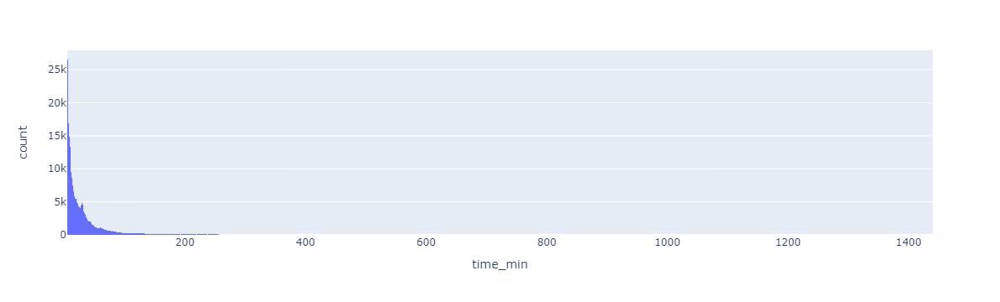

In [39]:
import plotly.express as px

px.histogram(flight_table_pdf_f, x= 'time_min')

In [ ]:
001496200e1af5820161057a2153c8551db15ed26d793fdaebb4ae46c4a57be3_2_2022_6

In [7]:
flight_table_pdf.id.value_counts()

001496200e1af5820161057a2153c8551db15ed26d793fdaebb4ae46c4a57be3_2_2022_6     1
3c0c48945581e61602b9fa8a7ed23a00704ca4fe2ecb3b8cf83e77f71a1b8125_39_2022_6    1
3b7c55123a82de7469b906814c8ecd6236802ee62339dc4bbc0c423caa8c7ac9_45_2022_6    1
3b82fc6a77e3ec4a6e7cec39185de4dcf1d29d312fc989e507b5e78be284228e_1_2022_6     1
3b9598928d1ee47a224ce7aa424c3652e5c5683b90677d0f81b157bdc8ddb046_11_2022_6    1
                                                                             ..
99d68193b5f9c606dd697fdae796415b10936a45595cb8e0bf19b04e21e76bd5_2_2022_6     1
99e0db6130b113d9dbc3c3e94077d0a8474eb777e37a700d42293c8b1273fd5b_69_2022_6    1
99f1f8a92c5d45828959a34f07fe6b105e993ad77f1b4fda5207870ba30db764_1_2022_6     1
99f8dad6aed9e7d39ae302639ef8b560049a03f333ba8d0783c0ae6d994e877f_15_2022_6    1
ffb2c693116aa2cd6d02c38bf89857d64b12f59a6ba0aff43f52eb2be3f97c63_26_2022_6    1
Name: id, Length: 1099297, dtype: int64

In [ ]:


#sdf.write.format('parquet').save("abfs://storage-fs@cdpdllive.dfs.core.windows.net/data/project/aiu.db/unmanaged/day_osn_h3_statevectors1.parquet")

#sdf = spark.read.format('parquet').load("abfs://storage-fs@cdpdllive.dfs.core.windows.net/data/project/aiu.db/unmanaged/day_osn_h3_statevectors1.parquet")

resolution = 7

def load_airport_hex(spark, resolution = 7):
    try:
        df_apt = pd.read_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}_processed.arrow')
        sdf_apt = spark.createDataFrame(df_apt)
        return sdf_apt
    except Exception as e:
        print(e)
        df_apt = pd.read_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}.arrow')
        # Filter out relevant hexagons
        df_apt = df_apt[df_apt.max_c_radius_nm<=30]
        df_apt = df_apt[['ident','hex_id', 'latitude_deg', 'longitude_deg']].explode('hex_id')
        df_apt = df_apt[~df_apt.hex_id.isna()]

        # Getting h3 positions of hexagons 
        df_apt['geo'] = df_apt['hex_id'].apply(lambda l:h3.h3_to_geo(l))
        df_apt['lat'] = df_apt['geo'].apply(lambda l:l[0])
        df_apt['lon'] = df_apt['geo'].apply(lambda l:l[1])
        df_apt = df_apt.drop('geo',axis=1)

        # OSN bounding box filter
        f_lat = np.logical_and(df_apt.lat >=26.74617, df_apt.lat <= 70.25976)  
        f_lon = np.logical_and(df_apt.lon >=-25.86653, df_apt.lon <= 49.65699)  
        f = np.logical_and(f_lat, f_lon)
        df_apt = df_apt[f]

        # Add center hex ids
        df_apt['center_hex_id'] = df_apt.apply(lambda l: h3.geo_to_h3(l['latitude_deg'], l['longitude_deg'], resolution=resolution), axis=1)

        # Renaming columns 
        df_apt.columns = ['apt_' + x for x in df_apt.columns]

        def calc_dist(h1,h2):
            try:
                return h3.h3_distance(h1,h2)
            except:
                return None

        df_apt['distance_from_center'] = df_apt.apply(lambda l:calc_dist(l['apt_hex_id'], l['apt_center_hex_id']), axis=1)

        df_apt = df_apt[~pd.isnull(df_apt['distance_from_center'])]

        df_apt = df_apt[['apt_ident', 'apt_hex_id', 'distance_from_center', 'apt_latitude_deg', 'apt_longitude_deg']]

        df_apt.to_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}_processed.arrow')

        # Creating spark df
        sdf_apt = spark.createDataFrame(df_apt)
        return sdf_apt

# Query data from datalake sample 

def fetch_and_label_sv(spark, project, month, sdf_apt):
    max_FL = 40
    
    sv = get_data_within_timeframe( # State Vectors sv
        spark = spark, 
        table_name = f'{project}.osn_tracks_clustered', 
        month = month)

    # Filter out rows with missing crucial data
    sv_f = sv.dropna(subset=['lat', 'lon', 'baro_altitude', 'track_id'])

    # Rename callsign to flight_id (official term)
    sv_f = sv_f.withColumnRenamed("callsign", "flight_id")

    # Replace missing 'flight_id' with empty string
    sv_f = sv_f.fillna({'flight_id': ''})

    # Convert event_time from posixtime to datetime 
    sv_f = sv_f.withColumn('event_time', F.to_timestamp(F.col('event_time')))

    # Add flight level proxy extracted from baro_altitude
    sv_f = sv_f.withColumn('flight_level', (col('baro_altitude') * 3.28084 / 100).cast('int'))

    # Select columns of interest
    columns_of_interest = [
        'track_id', 'icao24', 'flight_id', 'event_time', 'lat', 'lon',  'flight_level', 'baro_altitude',
        'heading', 'vert_rate',  'on_ground', 'h3_res_7', 'h3_res_11'
    ]
    sv_f = sv_f.select(columns_of_interest)

    # Calculate the DOF and first_seen & last_seen for each track
    window_spec_track = Window.partitionBy('track_id')
    sv_f = sv_f.withColumn('event_date', to_date('event_time'))
    sv_f = sv_f.withColumn('DOF', min('event_date').over(window_spec_track))
    sv_f = sv_f.withColumn('first_seen', min('event_time').over(window_spec_track))
    sv_f = sv_f.withColumn('last_seen', max('event_time').over(window_spec_track))

    # Add a constant column for SOURCE
    sv_f = sv_f.withColumn('source', F.lit('OSN'))

    # Filter out low altitude statevectors during landing/take-off (below FL20)
    # Implicitly we filter out any flights which are never noted below FL20
    sv_low_alt = sv_f.filter(col('flight_level') <= max_FL)

    # Merge airports hexaero grid (sdf_apt) onto statevectors to see which tracks are within 30 NM (+-h3 res 7 inaccuracy). 
    sv_nearby_apt = sv_low_alt.join(sdf_apt, (sv_low_alt.h3_res_7 == sdf_apt.apt_hex_id), "left")
    return sv_nearby_apt

# Determine landing or take-off depending on vert_rate
def categorize_landing_take_off(df):
    """Categorize the flight into 'take-off', 'landing', or 'constant_altitude'."""

    # Window specification for rolling average
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).orderBy('event_time').rowsBetween(-2, 2)

    # Calculate moving average of altitude
    df_m = df.withColumn('smoothed_altitude', F.avg('baro_altitude').over(window_spec))

    # Window specification for calculating altitude change
    window_spec_lag = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).orderBy('event_time')

    # Calculate change in smoothed altitude
    df_m = df_m.withColumn('altitude_change', F.col('smoothed_altitude') - F.lag('smoothed_altitude').over(window_spec_lag))

    # Determine if it's a take-off or landing
    df_m = df_m.withColumn('trajectory_type', 
                       F.when(F.col('altitude_change') > 0, 'take-off')
                        .when(F.col('altitude_change') < 0, 'landing')
                        .otherwise('constant altitude'))

    # Aggregate each track to a single 'flight' to determine overall flight type
    flight_type_df = df_m.groupBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).agg(
        F.sum(F.when(F.col('trajectory_type') == 'take-off', 1).otherwise(0)).alias('take_off_count'),
        F.sum(F.when(F.col('trajectory_type') == 'landing', 1).otherwise(0)).alias('landing_count')
    )

    # Determine overall flight type based on majority segments including ambiguous count
    flight_type_df = flight_type_df.withColumn('status', 
                                               # We get statevectors every 5 sec -> +4 requires at least 20 s in one state
                                               F.when(F.col('take_off_count') > (F.col('landing_count') + 4), 'take-off')  
                                              .when(F.col('landing_count') > (F.col('take_off_count') + 4), 'landing')
                                              .otherwise('ambiguous'))
    
    return df.join(flight_type_df, on=['icao24', 'flight_id', 'track_id', 'apt_ident'], how='left')



def compute_flight_table(df):
    """Compute flight table."""
    
    # Filter out ambiguous landings/take-offs from flights (likely helicopters / go-arounds)
    #df = df.filter(df.status != "ambiguous")
    
    # Calculate the statevector with the minimal distance from the airport center hex id
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'status'])
    df = df.withColumn('min_distance', F.min('distance_from_center').over(window_spec))
    
    df_min_distance = df.filter(df.distance_from_center == df.min_distance)
    
    df_min_distance = df_min_distance.select(
        [
            'icao24', 'flight_id', 'track_id', 
            'apt_ident', 'apt_longitude_deg', 'apt_latitude_deg', 'DOF','first_seen', 
            'last_seen', 'status', 'event_time', 'lat', 'lon', 
            'min_distance', 'source', 'take_off_count', 'landing_count'])
    
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident', 'status'])
    df_min_distance = df_min_distance.withColumn(
        'min_time', F.min('event_time').over(window_spec)).withColumn(
        'max_time', F.max('event_time').over(window_spec))
    
    df_take_off = df_min_distance.filter((F.col('status') == F.lit('take-off')) & (F.col('event_time') == F.col('min_time')))
    df_landing = df_min_distance.filter((F.col('status') == F.lit('landing')) & (F.col('event_time') == F.col('max_time')))
    df_ambiguous = df_min_distance.filter((F.col('status') == F.lit('ambiguous')) & (F.col('event_time') == F.col('max_time')))
    
    flight_table = df_take_off.union(df_landing).union(df_ambiguous)
    
    # Sometimes there's still multiple airports for a landing / take-off 
    # In this case we'll select the airport with the minimal distance in NM  

    # Radius of the Earth in km
    R = 6371.0

    # Haversine formula implemented in PySpark
    flight_table = flight_table.withColumn("lat1", radians(col("lat"))) \
           .withColumn("lon1", radians(col("lon"))) \
           .withColumn("lat2", radians(col("apt_latitude_deg"))) \
           .withColumn("lon2", radians(col("apt_longitude_deg"))) \
           .withColumn("dlat", col("lat2") - col("lat1")) \
           .withColumn("dlon", col("lon2") - col("lon1")) \
           .withColumn("a", sin(col("dlat") / 2) ** 2 + cos(col("lat1")) * cos(col("lat2")) * sin(col("dlon") / 2) ** 2) \
           .withColumn("c", 2 * atan2(sqrt(col("a")), sqrt(1 - col("a")))) \
           .withColumn("distance_km", R * col("c"))

    # Define the key columns
    key_columns = ['icao24', 'flight_id', 'track_id', 'status', 'first_seen', 'last_seen']

    # Window specification to find the closest airport
    windowSpec = Window.partitionBy(key_columns).orderBy(col("distance_km"))

    # Add row numbers to identify the closest airport
    df_with_row_numbers = flight_table.withColumn("row_number", row_number().over(windowSpec))

    # Filter out the most likely airport and keep the rest as potential airports
    filtered_df = df_with_row_numbers.withColumn("is_most_likely", col("row_number") == 1)

    # Aggregate to find the most likely airport and collect potential airports
    result_df = filtered_df.groupBy(key_columns) \
        .agg(
            expr("first(apt_ident) as most_likely_airport"),
            collect_list(expr("case when not is_most_likely then apt_ident end")).alias("potential_airports")
        )

    # Select the final columns to keep
    result_df = result_df.select(
        *key_columns,
        col("most_likely_airport"),
        col("potential_airports")
    )
    
    
    # Filter take-offs and landings
    take_offs = result_df.filter(col('status') == 'take-off')
    landings = result_df.filter(col('status') == 'landing')

    # Rename columns
    take_offs = take_offs.withColumnRenamed('most_likely_airport', 'ADEP')\
                         .withColumnRenamed('potential_airports', 'ADEP_P')

    landings = landings.withColumnRenamed('most_likely_airport', 'ADES')\
                       .withColumnRenamed('potential_airports', 'ADES_P')

    # Define key columns
    key_cols = ['icao24', 'flight_id', 'track_id', 'first_seen', 'last_seen']

    # Merge the DataFrames
    flight_table = take_offs.drop('status')\
                            .join(landings.drop('status'), on=key_cols, how='outer')
    
    # Add a new column 'DOF' which is the date part of 'first_seen'
    flight_table = flight_table.withColumn('DOF', to_date(col('first_seen')))
    
    # Rename
    flight_table = flight_table.withColumnRenamed('track_id', 'id')\
                                .withColumnRenamed('icao24', 'ICAO24')\
                                .withColumnRenamed('flight_id', 'FLT_ID')
    
    # Add version
    flight_table = flight_table.withColumn('version', F.lit('v2.0.0'))
    
    # Final cleaning
    flight_table = flight_table.select(
        'id',
        'ADEP', 
        'ADES', 
        'ADEP_P', 
        'ADES_P', 
        'ICAO24', 
        'FLT_ID', 
        'first_seen', 
        'last_seen', 
        'DOF', 
        'version')
    
    return flight_table



def process_flight_table(spark, project, month):
    print(f'Processing from {start_date} until {end_date}...')
    sdf_apt = load_airports_hex(spark, resolution = 7)

    sv_nearby_apt = fetch_and_label_sv(spark, project, month, sdf_apt)

    sv_nearby_apt = categorize_landing_take_off(sv_nearby_apt)

    flight_table = compute_flight_table(sv_nearby_apt)
    
    flight_table.write.mode("append").insertInto(f"`{project}`.`osn_flight_table`")

# Actual processing
start_month = date(2022, 1, 1)
end_month = date(2024, 6, 1)

to_process_months = generate_months(start_month, end_month)

## Load logs
fpath = 'logs/03_osn-flight_table-etl-log.parquet'
if os.path.isfile(fpath):
    processed_months = pd.read_parquet(fpath).months.to_list()
else:
    processed_months = []

## Process loop
for month in to_process_months:
    print(f'Processing month: {month}')
    if month in processed_months:
        continue
    else:
        process_flight_table(spark, project, month):

        ## Logging
        processed_months.append(month)
        processed_df = pd.DataFrame({'months':processed_months})
        processed_df.to_parquet(fpath)

# Stop the SparkSession
spark.stop()

## Create airport runway hexagonification spark dataset 

#### Reasoning

For an incoming aircraft, landing in the center of this cylinder would be at an angle of 3 degrees. Assuming we want to see - at least - the flight coming down from FL10 to see the landing, we need thus to have a minimal distance tan(3) = 3048/? => ? = 3048/tan(3) = 58159 meter = 31,403348 nautical miles. 

For outgoing landing, the take-off angle is much steeper, up to 15 degrees. Let's say we thus look up to FL40. 

We'll thus look into concentric circles 30NM around the airport and a max flight level FL40 (which covers higher outgoing angles). 

#### To do:
   * Upload airport_concentric_c_hex_res_7.arrow dataset to datalake.

### Clean statevector data & filter out low altitude (<FL20)

In [5]:
resolution = 7

def load_airport_hex(spark, resolution = 7):
    try:
        df_apt = pd.read_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}_processed.arrow')
        sdf_apt = spark.createDataFrame(df_apt)
        return sdf_apt
    except Exception as e:
        print(e)
        df_apt = pd.read_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}.arrow')
        # Filter out relevant hexagons
        df_apt = df_apt[df_apt.max_c_radius_nm<=30]
        df_apt = df_apt[['ident','hex_id', 'latitude_deg', 'longitude_deg']].explode('hex_id')
        df_apt = df_apt[~df_apt.hex_id.isna()]

        # Getting h3 positions of hexagons 
        df_apt['geo'] = df_apt['hex_id'].apply(lambda l:h3.h3_to_geo(l))
        df_apt['lat'] = df_apt['geo'].apply(lambda l:l[0])
        df_apt['lon'] = df_apt['geo'].apply(lambda l:l[1])
        df_apt = df_apt.drop('geo',axis=1)

        # OSN bounding box filter
        f_lat = np.logical_and(df_apt.lat >=26.74617, df_apt.lat <= 70.25976)  
        f_lon = np.logical_and(df_apt.lon >=-25.86653, df_apt.lon <= 49.65699)  
        f = np.logical_and(f_lat, f_lon)
        df_apt = df_apt[f]

        # Add center hex ids
        df_apt['center_hex_id'] = df_apt.apply(lambda l: h3.geo_to_h3(l['latitude_deg'], l['longitude_deg'], resolution=resolution), axis=1)

        # Renaming columns 
        df_apt.columns = ['apt_' + x for x in df_apt.columns]

        def calc_dist(h1,h2):
            try:
                return h3.h3_distance(h1,h2)
            except:
                return None

        df_apt['distance_from_center'] = df_apt.apply(lambda l:calc_dist(l['apt_hex_id'], l['apt_center_hex_id']), axis=1)

        df_apt = df_apt[~pd.isnull(df_apt['distance_from_center'])]

        df_apt = df_apt[['apt_ident', 'apt_hex_id', 'distance_from_center', 'apt_latitude_deg', 'apt_longitude_deg']]

        df_apt.to_parquet(f'../../../data/airport_hex/airport_concentric_c_hex_res_{resolution}_processed.arrow')

        # Creating spark df
        sdf_apt = spark.createDataFrame(df_apt)
        return sdf_apt

# Query data from datalake sample 

def fetch_and_label_sv(spark, project, month, sdf_apt):
    max_FL = 40
    
    sv = get_data_within_timeframe( # State Vectors sv
        spark = spark, 
        table_name = f'{project}.osn_tracks_clustered', 
        month = month)

    # Filter out rows with missing crucial data
    sv_f = sv.dropna(subset=['lat', 'lon', 'baro_altitude', 'track_id'])

    # Rename callsign to flight_id (official term)
    sv_f = sv_f.withColumnRenamed("callsign", "flight_id")

    # Replace missing 'flight_id' with empty string
    sv_f = sv_f.fillna({'flight_id': ''})

    # Convert event_time from posixtime to datetime 
    sv_f = sv_f.withColumn('event_time', F.to_timestamp(F.col('event_time')))

    # Add flight level proxy extracted from baro_altitude
    sv_f = sv_f.withColumn('flight_level', (col('baro_altitude') * 3.28084 / 100).cast('int'))

    # Select columns of interest
    columns_of_interest = [
        'track_id', 'icao24', 'flight_id', 'event_time', 'lat', 'lon',  'flight_level', 'baro_altitude',
        'heading', 'vert_rate',  'on_ground', 'h3_res_7', 'h3_res_11'
    ]
    sv_f = sv_f.select(columns_of_interest)

    # Calculate the DOF and first_seen & last_seen for each track
    window_spec_track = Window.partitionBy('track_id')
    sv_f = sv_f.withColumn('event_date', to_date('event_time'))
    sv_f = sv_f.withColumn('DOF', min('event_date').over(window_spec_track))
    sv_f = sv_f.withColumn('first_seen', min('event_time').over(window_spec_track))
    sv_f = sv_f.withColumn('last_seen', max('event_time').over(window_spec_track))

    # Add a constant column for SOURCE
    sv_f = sv_f.withColumn('source', F.lit('OSN'))

    # Filter out low altitude statevectors during landing/take-off (below FL20)
    # Implicitly we filter out any flights which are never noted below FL20
    sv_low_alt = sv_f.filter(col('flight_level') <= max_FL)

    # Merge airports hexaero grid (sdf_apt) onto statevectors to see which tracks are within 30 NM (+-h3 res 7 inaccuracy). 
    sv_nearby_apt = sv_low_alt.join(sdf_apt, (sv_low_alt.h3_res_7 == sdf_apt.apt_hex_id), "left")
    return sv_nearby_apt

# Determine landing or take-off depending on vert_rate
def categorize_landing_take_off(df):
    """Categorize the flight into 'take-off', 'landing', or 'constant_altitude'."""

    # Window specification for rolling average
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).orderBy('event_time').rowsBetween(-2, 2)

    # Calculate moving average of altitude
    df_m = df.withColumn('smoothed_altitude', F.avg('baro_altitude').over(window_spec))

    # Window specification for calculating altitude change
    window_spec_lag = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).orderBy('event_time')

    # Calculate change in smoothed altitude
    df_m = df_m.withColumn('altitude_change', F.col('smoothed_altitude') - F.lag('smoothed_altitude').over(window_spec_lag))

    # Determine if it's a take-off or landing
    df_m = df_m.withColumn('trajectory_type', 
                       F.when(F.col('altitude_change') > 0, 'take-off')
                        .when(F.col('altitude_change') < 0, 'landing')
                        .otherwise('constant altitude'))

    # Aggregate each track to a single 'flight' to determine overall flight type
    flight_type_df = df_m.groupBy(['icao24', 'flight_id', 'track_id', 'apt_ident']).agg(
        F.sum(F.when(F.col('trajectory_type') == 'take-off', 1).otherwise(0)).alias('take_off_count'),
        F.sum(F.when(F.col('trajectory_type') == 'landing', 1).otherwise(0)).alias('landing_count')
    )

    # Determine overall flight type based on majority segments including ambiguous count
    flight_type_df = flight_type_df.withColumn('status', 
                                               # We get statevectors every 5 sec -> +4 requires at least 20 s in one state
                                               F.when(F.col('take_off_count') > (F.col('landing_count') + 4), 'take-off')  
                                              .when(F.col('landing_count') > (F.col('take_off_count') + 4), 'landing')
                                              .otherwise('ambiguous'))
    
    return df.join(flight_type_df, on=['icao24', 'flight_id', 'track_id', 'apt_ident'], how='left')



def compute_flight_table(df):
    """Compute flight table."""
    
    # Filter out ambiguous landings/take-offs from flights (likely helicopters / go-arounds)
    #df = df.filter(df.status != "ambiguous")
    
    # Calculate the statevector with the minimal distance from the airport center hex id
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'status'])
    df = df.withColumn('min_distance', F.min('distance_from_center').over(window_spec))
    
    df_min_distance = df.filter(df.distance_from_center == df.min_distance)
    
    df_min_distance = df_min_distance.select(
        [
            'icao24', 'flight_id', 'track_id', 
            'apt_ident', 'apt_longitude_deg', 'apt_latitude_deg', 'DOF','first_seen', 
            'last_seen', 'status', 'event_time', 'lat', 'lon', 
            'min_distance', 'source', 'take_off_count', 'landing_count'])
    
    window_spec = Window.partitionBy(['icao24', 'flight_id', 'track_id', 'apt_ident', 'status'])
    df_min_distance = df_min_distance.withColumn(
        'min_time', F.min('event_time').over(window_spec)).withColumn(
        'max_time', F.max('event_time').over(window_spec))
    
    df_take_off = df_min_distance.filter((F.col('status') == F.lit('take-off')) & (F.col('event_time') == F.col('min_time')))
    df_landing = df_min_distance.filter((F.col('status') == F.lit('landing')) & (F.col('event_time') == F.col('max_time')))
    df_ambiguous = df_min_distance.filter((F.col('status') == F.lit('ambiguous')) & (F.col('event_time') == F.col('max_time')))
    
    flight_table = df_take_off.union(df_landing).union(df_ambiguous)
    
    # Sometimes there's still multiple airports for a landing / take-off 
    # In this case we'll select the airport with the minimal distance in NM  

    # Radius of the Earth in km
    R = 6371.0

    # Haversine formula implemented in PySpark
    flight_table = flight_table.withColumn("lat1", radians(col("lat"))) \
           .withColumn("lon1", radians(col("lon"))) \
           .withColumn("lat2", radians(col("apt_latitude_deg"))) \
           .withColumn("lon2", radians(col("apt_longitude_deg"))) \
           .withColumn("dlat", col("lat2") - col("lat1")) \
           .withColumn("dlon", col("lon2") - col("lon1")) \
           .withColumn("a", sin(col("dlat") / 2) ** 2 + cos(col("lat1")) * cos(col("lat2")) * sin(col("dlon") / 2) ** 2) \
           .withColumn("c", 2 * atan2(sqrt(col("a")), sqrt(1 - col("a")))) \
           .withColumn("distance_km", R * col("c"))

    # Define the key columns
    key_columns = ['icao24', 'flight_id', 'track_id', 'status', 'first_seen', 'last_seen']

    # Window specification to find the closest airport
    windowSpec = Window.partitionBy(key_columns).orderBy(col("distance_km"))

    # Add row numbers to identify the closest airport
    df_with_row_numbers = flight_table.withColumn("row_number", row_number().over(windowSpec))

    # Filter out the most likely airport and keep the rest as potential airports
    filtered_df = df_with_row_numbers.withColumn("is_most_likely", col("row_number") == 1)

    # Aggregate to find the most likely airport and collect potential airports
    result_df = filtered_df.groupBy(key_columns) \
        .agg(
            expr("first(apt_ident) as most_likely_airport"),
            collect_list(expr("case when not is_most_likely then apt_ident end")).alias("potential_airports")
        )

    # Select the final columns to keep
    result_df = result_df.select(
        *key_columns,
        col("most_likely_airport"),
        col("potential_airports")
    )
    
    
    # Filter take-offs and landings
    take_offs = result_df.filter(col('status') == 'take-off')
    landings = result_df.filter(col('status') == 'landing')

    # Rename columns
    take_offs = take_offs.withColumnRenamed('most_likely_airport', 'ADEP')\
                         .withColumnRenamed('potential_airports', 'ADEP_P')

    landings = landings.withColumnRenamed('most_likely_airport', 'ADES')\
                       .withColumnRenamed('potential_airports', 'ADES_P')

    # Define key columns
    key_cols = ['icao24', 'flight_id', 'track_id', 'first_seen', 'last_seen']

    # Merge the DataFrames
    flight_table = take_offs.drop('status')\
                            .join(landings.drop('status'), on=key_cols, how='outer')
    
    # Add a new column 'DOF' which is the date part of 'first_seen'
    flight_table = flight_table.withColumn('DOF', to_date(col('first_seen')))
    
    # Rename
    flight_table = flight_table.withColumnRenamed('track_id', 'id')\
                                .withColumnRenamed('icao24', 'ICAO24')\
                                .withColumnRenamed('flight_id', 'FLT_ID')
    
    # Add version
    flight_table = flight_table.withColumn('version', F.lit('v2.0.0'))
    
    # Final cleaning
    flight_table = flight_table.select(
        'id',
        'ADEP', 
        'ADES', 
        'ADEP_P', 
        'ADES_P', 
        'ICAO24', 
        'FLT_ID', 
        'first_seen', 
        'last_seen', 
        'DOF', 
        'version')
    
    return flight_table



def process_flight_table(spark, project, month):
    print(f'Processing from {start_date} until {end_date}...')
    sdf_apt = load_airports_hex(spark, resolution = 7)

    sv_nearby_apt = fetch_and_label_sv(spark, project, month, sdf_apt)

    sv_nearby_apt = categorize_landing_take_off(sv_nearby_apt)

    flight_table = compute_flight_table(sv_nearby_apt)
    
    flight_table.write.mode("append").insertInto(f"`{project}`.`osn_flight_table`")

# Actual processing
start_month = date(2022, 1, 1)
end_month = date(2024, 6, 1)

to_process_months = generate_months(start_month, end_month)

## Load logs
fpath = 'logs/03_osn-flight_table-etl-log.parquet'
if os.path.isfile(fpath):
    processed_months = pd.read_parquet(fpath).months.to_list()
else:
    processed_months = []

## Process loop
for month in to_process_months:
    print(f'Processing month: {month}')
    if month in processed_months:
        continue
    else:
        process_flight_table(spark, project, month):

        ## Logging
        processed_months.append(month)
        processed_df = pd.DataFrame({'months':processed_months})
        processed_df.to_parquet(fpath)

# Stop the SparkSession
spark.stop()